In [101]:
import json
import glob
import numpy as np


In [102]:

def load_jsonl(file_path):
    data = []
    with open(file_path, "r") as f:
        for line in f:
            data.append(json.loads(line))
    return data
def load_sp_results(base_path):
    sp_results = {}
    json_files = glob.glob(f"{base_path}/**/*.jsonl", recursive=True)
    for json_file in json_files:
        dataset = json_file.split("/")[-3]
        base_path = json_file.split("/")[-1]
        items = base_path.split("_")
        judge = items[0]
        ref = items[1]
        data = load_jsonl(json_file)
        if dataset not in sp_results:
            sp_results[dataset] = {}
        if judge not in sp_results[dataset]:
            sp_results[dataset][judge] = {}
        sp_results[dataset][judge][ref] = data
    return sp_results


base = load_sp_results("../llm-sp/sp/")

In [148]:
def get_judge_acc(dataset, judge, ref = 'phi-3.5-mini'):
    data = base[dataset][judge][ref]
    total = len(data)
    correct = sum(d['assistent_1_is_correct'] for d in data)
    return correct / total

def get_ref_acc(dataset, ref, judge = 'gemma-2-9b'):
    data = base[dataset][judge][ref]
    total = len(data)
    correct = sum(d['assistent_2_is_correct'] for d in data)
    return correct / total

datasets = base.keys()
results_data = {}
judge_models = base['math500'].keys()
ref_models = base['math500']['gemma-2-9b'].keys()
for model in judge_models:
    model_results = {"type": "judge"}
    for dataset in datasets:
        assert all(get_judge_acc(dataset, model, ref) == get_judge_acc(dataset, model) for ref in ref_models)
        model_results[dataset] = get_judge_acc(dataset, model)
    results_data[model] = model_results
for model in ref_models:
    model_results = {"type": "ref"}
    for dataset in datasets:
        assert all(get_ref_acc(dataset, model, judge) == get_ref_acc(dataset, model) for judge in judge_models)
        model_results[dataset] = get_ref_acc(dataset, model)
    results_data[model] = model_results


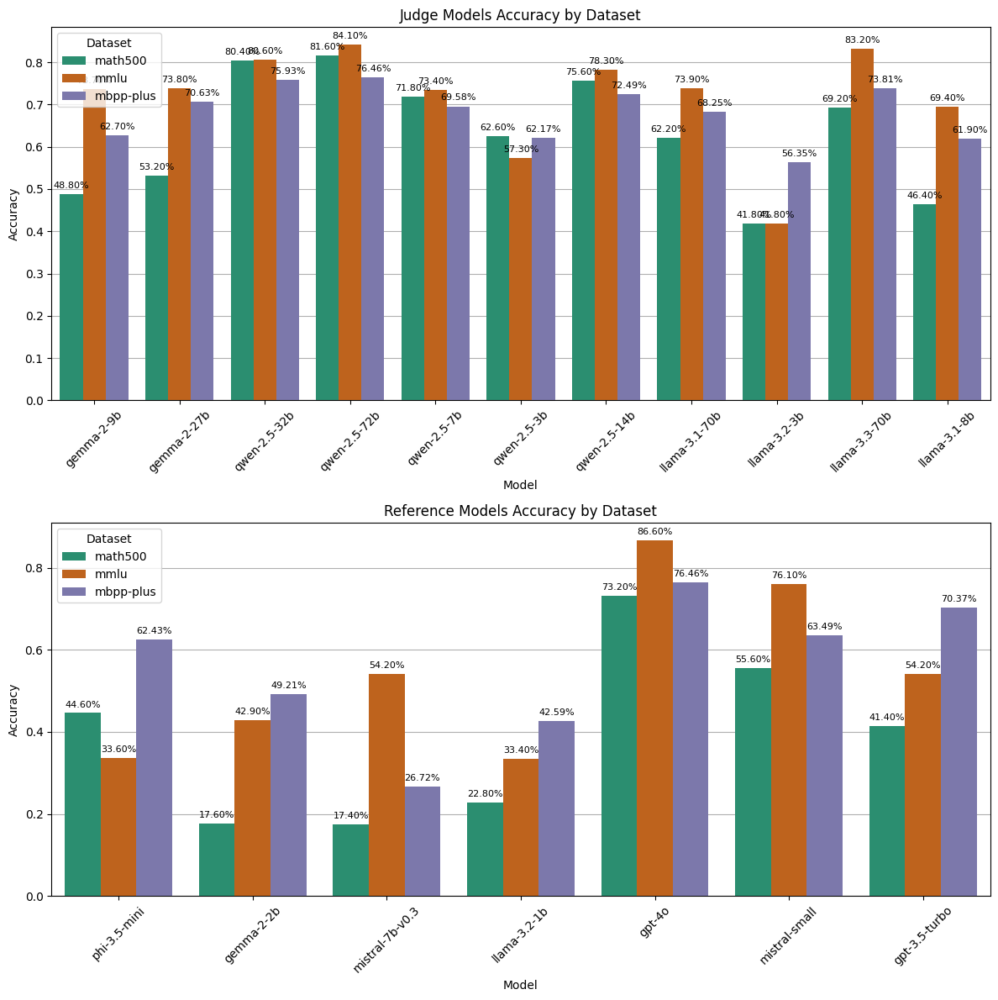

In [153]:
results_df = pd.DataFrame(results_data).T

import seaborn as sns
import matplotlib.pyplot as plt

# Melt the DataFrame for plotting
melted = results_df.reset_index().melt(id_vars=['index', 'type'], var_name='Dataset', value_name='Score')
melted.rename(columns={'index': 'Model'}, inplace=True)

# Separate plots for judges and refs
fig, axes = plt.subplots(2, 1, figsize=(12, 12), sharex=False)

# Judges plot
melted_judges = melted[melted['type'] == 'judge']
axes[0].grid(True, zorder=0)
sns.barplot(data=melted_judges, x='Model', y='Score', hue='Dataset', palette='Dark2', ax=axes[0], zorder=3)
axes[0].set_title('Judge Models Accuracy by Dataset')
axes[0].set_ylabel('Accuracy')
axes[0].tick_params(axis='x', rotation=45)

# Add annotations for judges
for p in axes[0].patches:
    height = p.get_height()
    if height > 0:
        axes[0].text(p.get_x() + p.get_width()/2., height + 0.01, f'{height*100:.2f}%', ha='center', va='bottom', fontsize=8, zorder=4)

# Refs plot
melted_refs = melted[melted['type'] == 'ref']
axes[1].grid(True, zorder=0)
sns.barplot(data=melted_refs, x='Model', y='Score', hue='Dataset', palette='Dark2', ax=axes[1], zorder=3)
axes[1].set_title('Reference Models Accuracy by Dataset')
axes[1].set_xlabel('Model')
axes[1].set_ylabel('Accuracy')
axes[1].tick_params(axis='x', rotation=45)

# Add annotations for refs
for p in axes[1].patches:
    height = p.get_height()
    if height > 0:
        axes[1].text(p.get_x() + p.get_width()/2., height + 0.01, f'{height*100:.2f}%', ha='center', va='bottom', fontsize=8, zorder=4)

# Adjust layout
plt.tight_layout()
plt.show()


In [19]:
# LaTeX table for both judges and refs
judges_pct = (results_df[results_df['type'] == 'judge'].drop('type', axis=1) * 100).round(2)
judges_avg = judges_pct.mean()
judges_pct.loc['Average'] = judges_avg

refs_pct = (results_df[results_df['type'] == 'ref'].drop('type', axis=1) * 100).round(2)
refs_avg = refs_pct.mean()
refs_pct.loc['Average'] = refs_avg

combined = pd.concat([judges_pct, refs_pct], keys=['Judge', 'Reference'], names=['Type'])
print(combined.to_latex(float_format="%.2f"))

\begin{tabular}{lllll}
\toprule
 &  & math500 & mmlu & mbpp-plus \\
Type &  &  &  &  \\
\midrule
\multirow[t]{12}{*}{Judge} & gemma-2-9b & 48.80 & 73.70 & 62.70 \\
 & gemma-2-27b & 53.20 & 73.80 & 70.63 \\
 & qwen-2.5-32b & 80.40 & 80.60 & 75.93 \\
 & qwen-2.5-72b & 81.60 & 84.10 & 76.46 \\
 & qwen-2.5-7b & 71.80 & 73.40 & 69.58 \\
 & qwen-2.5-3b & 62.60 & 57.30 & 62.17 \\
 & qwen-2.5-14b & 75.60 & 78.30 & 72.49 \\
 & llama-3.1-70b & 62.20 & 73.90 & 68.25 \\
 & llama-3.2-3b & 41.80 & 41.80 & 56.35 \\
 & llama-3.3-70b & 69.20 & 83.20 & 73.81 \\
 & llama-3.1-8b & 46.40 & 69.40 & 61.90 \\
 & Average & 63.05 & 71.77 & 68.21 \\
\cline{1-5}
\multirow[t]{8}{*}{Reference} & phi-3.5-mini & 44.60 & 33.60 & 62.43 \\
 & gemma-2-2b & 17.60 & 42.90 & 49.21 \\
 & mistral-7b-v0.3 & 17.40 & 54.20 & 26.72 \\
 & llama-3.2-1b & 22.80 & 33.40 & 42.59 \\
 & gpt-4o & 73.20 & 86.60 & 76.46 \\
 & mistral-small & 55.60 & 76.10 & 63.49 \\
 & gpt-3.5-turbo & 41.40 & 54.20 & 70.37 \\
 & Average & 38.94 & 54.43 & 5

In [ ]:
def who_won(base, dataset, judge, ref, index):
    return base[dataset][judge][ref][index]['assistent_1_is_correct'], base[dataset][judge][ref][index]['assistent_2_is_correct']

def get_score(base, dataset, judge, ref, index):
    datapoint = base[dataset][judge][ref][index]
    
    game_1_mapping = ['self', 'tie', 'other']
    game_2_mapping = ['other', 'tie', 'self']
    
    game_1_winner = np.argmax(datapoint['game_1_spb_score'])
    game_2_winner = np.argmax(datapoint['game_2_spb_score'])
    print(datapoint['game_1_spb_score'])
    print(datapoint['game_2_spb_score'])
    print("---")
    return (game_1_mapping[game_1_winner], datapoint['game_1_spb_score'][game_1_winner]), \
            (game_2_mapping[game_2_winner], datapoint['game_2_spb_score'][game_2_winner])

def get_winner(base, dataset, judge, ref, index, conflict = False):
    datapoint = base[dataset][judge][ref][index]
    (g1, s1), (g2, s2) = get_score(base, dataset, judge, ref, index)
    who_won = None
    if g1 == g2:
        who_won = g1
    else:
        if conflict:
            who_won = 'conflict'
        else:
            if g1 == 'tie':
                who_won = g2
            elif g2 == 'tie':
                who_won = g1
            else:
                who_won = 'tie'


    game_1_mapping = ['self', 'tie', 'other']
    game_2_mapping = ['other', 'tie', 'self']
    
    p_self = (datapoint['game_1_spb_score'][0] + datapoint['game_2_spb_score'][2]) / 2
    
    return who_won, p_self

In [34]:
i = 20

who_won(base, 'mmlu', 'llama-3.1-8b', 'gpt-3.5-turbo', i)
get_score(base, 'mmlu', 'llama-3.1-8b', 'gpt-3.5-turbo', i)

#base['mmlu']['llama-3.1-8b']['gpt-3.5-turbo'][i]

[0.31916776299476624, 0.36166447401046753, 0.31916776299476624]
[0.9464991688728333, 0.047123417258262634, 0.006377461366355419]
---


(('tie', 0.36166447401046753), ('other', 0.9464991688728333))

## 

[0.5564771294593811, 0.2628611624240875, 0.1806616634130478]
[0.7752381563186646, 0.15265344083309174, 0.07210838794708252]
---
[0.8157972097396851, 0.05909615382552147, 0.1251065582036972]
[0.9875683188438416, 0.012431650422513485, 1.064986832886861e-43]
---
[0.4443701505661011, 0.1634746491909027, 0.3921552896499634]
[0.8988671898841858, 0.08360767364501953, 0.017525119706988335]
---
[0.5897976160049438, 0.27860066294670105, 0.13160164654254913]
[0.30175817012786865, 0.638822078704834, 0.05941971391439438]
---
[0.27860066294670105, 0.5897976160049438, 0.13160164654254913]
[0.5808863043785095, 0.3992369472980499, 0.019876835867762566]
---
[0.49810025095939636, 0.2352858930826187, 0.2666138708591461]
[0.7535063028335571, 0.11555393785238266, 0.1309397667646408]
---
[0.33628758788108826, 0.03544444963335991, 0.6282678842544556]
[0.9280324578285217, 0.03598373383283615, 0.03598373383283615]
---
[0.7594732046127319, 0.02293410338461399, 0.21759271621704102]
[0.843149721622467, 0.078425146

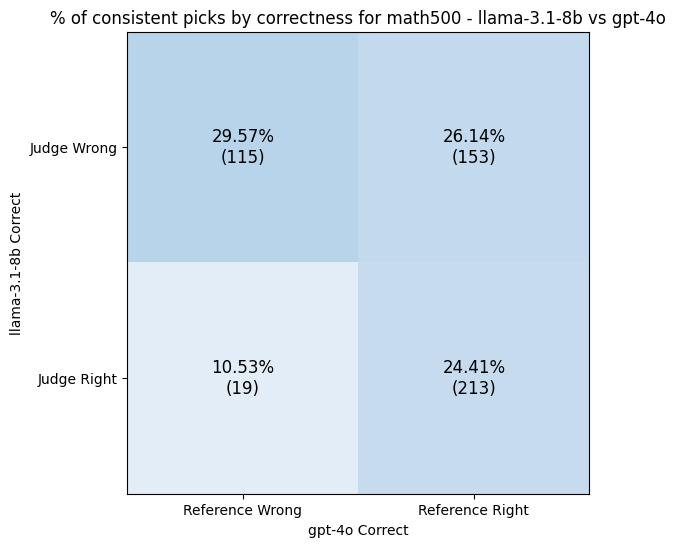

In [109]:
import numpy as np
import matplotlib.pyplot as plt

def compute_matrix_with_p_self(base, dataset, judge, ref):
    matrix_counts = np.zeros((2, 2))
    matrix_p_self = np.zeros((2, 2))
    matrix_p_denom = np.zeros((2, 2))
    for i, datapoint in enumerate(base[dataset][judge][ref]):
        a1_correct = datapoint['assistent_1_is_correct']
        a2_correct = datapoint['assistent_2_is_correct']
        score, _ = get_winner(base, dataset, judge, ref, i)
        p_self = 1 if score == 'self' else 0
        denominator = 1 if score != 'tie' else 0
        matrix_counts[int(a1_correct), int(a2_correct)] += 1
        matrix_p_self[int(a1_correct), int(a2_correct)] += p_self
        matrix_p_denom[int(a1_correct), int(a2_correct)] += denominator
    with np.errstate(divide='ignore', invalid='ignore'):
        matrix_p_self = np.divide(matrix_p_denom, matrix_counts, out=np.zeros_like(matrix_p_self), where=matrix_counts != 0)
    return matrix_p_self, matrix_counts

# Example usage
dataset = 'math500'
judge = 'llama-3.1-8b'
ref = 'gpt-4o'

matrix_p_self, matrix_counts = compute_matrix_with_p_self(base, dataset, judge, ref)

print("P(self) Matrix (rows: assistant_1_correct, columns: assistant_2_correct):")
print(matrix_p_self)
print("Counts Matrix:")
print(matrix_counts)

# Plot as confusion matrix style
fig, ax = plt.subplots(figsize=(6, 6))
im = ax.imshow(matrix_p_self, cmap='Blues', vmin=0, vmax=1)

ax.set_xticks([0, 1])
ax.set_yticks([0, 1])
ax.set_xticklabels(['Reference Wrong', 'Reference Right'])
ax.set_yticklabels(['Judge Wrong', 'Judge Right'])
ax.set_xlabel(f'{ref} Correct')
ax.set_ylabel(f'{judge} Correct')
ax.set_title(f'% of consistent picks by correctness for {dataset} - {judge} vs {ref}')

# Add text annotations
for i in range(2):
    for j in range(2):
        text = f"{100 * matrix_p_self[i, j]:.2f}%\n({int(matrix_counts[i, j])})"
        ax.text(j, i, text, ha='center', va='center', color='black', fontsize=12)

plt.show()

### Number of $D_{\text{diff}}$ points

In [106]:
def get_exactly_one_correct(base, dataset, judge, ref):
    """
    Takes base data, dataset, judge, ref.
    Returns the count of examples where exactly one model is correct, the percentage of total,
    and the percentage of exactly-one-correct cases where A2 is correct.
    """
    data = base[dataset][judge][ref]
    count_exactly_one = 0
    count_a2_correct_only = 0
    total = len(data)
    for datapoint in data:
        a1_correct = datapoint['assistent_1_is_correct']
        a2_correct = datapoint['assistent_2_is_correct']
        if (a1_correct and not a2_correct):
            count_exactly_one += 1
        elif (not a1_correct and a2_correct):
            count_exactly_one += 1
            count_a2_correct_only += 1
    percentage = (count_exactly_one / total) * 100 if total > 0 else 0
    a2_correct_pct = (count_a2_correct_only / count_exactly_one) * 100 if count_exactly_one > 0 else 0
    return count_exactly_one, percentage, a2_correct_pct

/var/folders/th/r_z7m5js0_z5lgk1tlr478p40000gn/T/ipykernel_63151/1142014918.py:28: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  annot_matrix = pct_pivot.applymap(lambda x: f"{x:.2f}") + "\n(" + a2_pivot.applymap(lambda x: f"{x:.2f}") + ")"


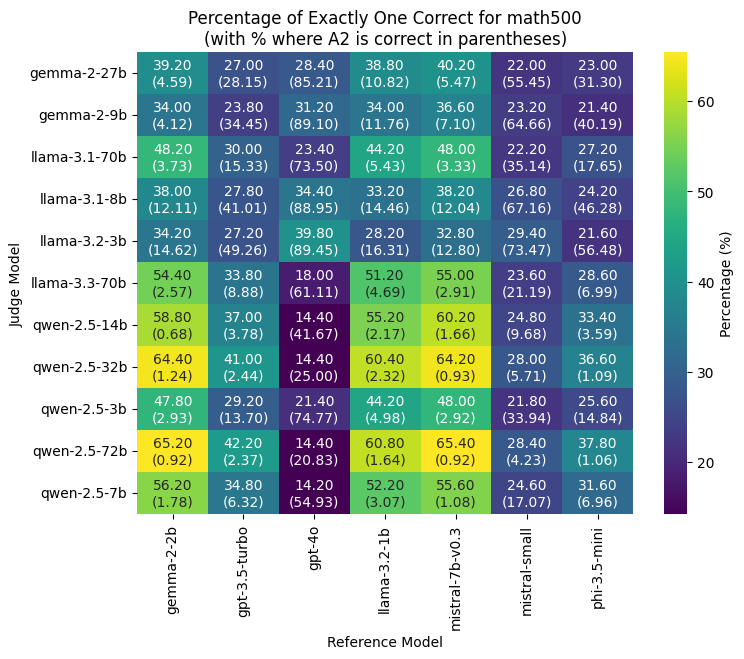

/var/folders/th/r_z7m5js0_z5lgk1tlr478p40000gn/T/ipykernel_63151/1142014918.py:28: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  annot_matrix = pct_pivot.applymap(lambda x: f"{x:.2f}") + "\n(" + a2_pivot.applymap(lambda x: f"{x:.2f}") + ")"


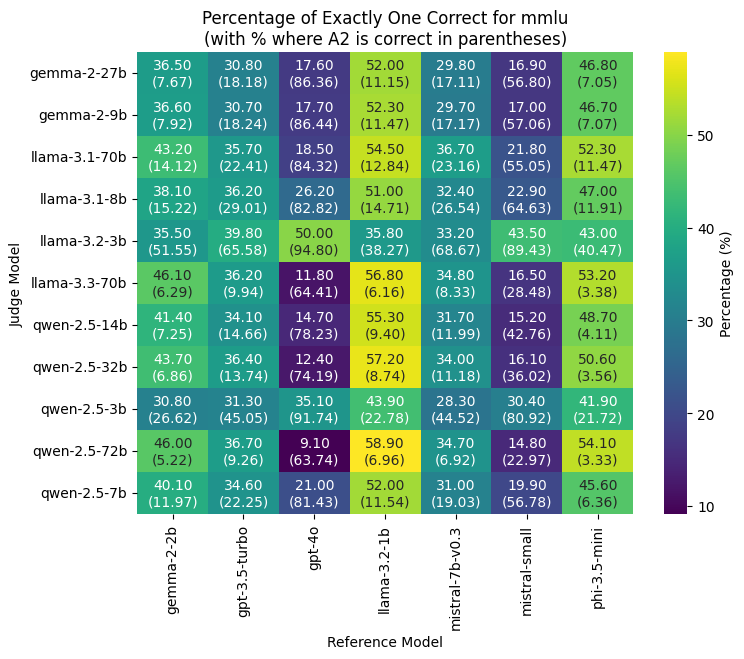

/var/folders/th/r_z7m5js0_z5lgk1tlr478p40000gn/T/ipykernel_63151/1142014918.py:28: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  annot_matrix = pct_pivot.applymap(lambda x: f"{x:.2f}") + "\n(" + a2_pivot.applymap(lambda x: f"{x:.2f}") + ")"


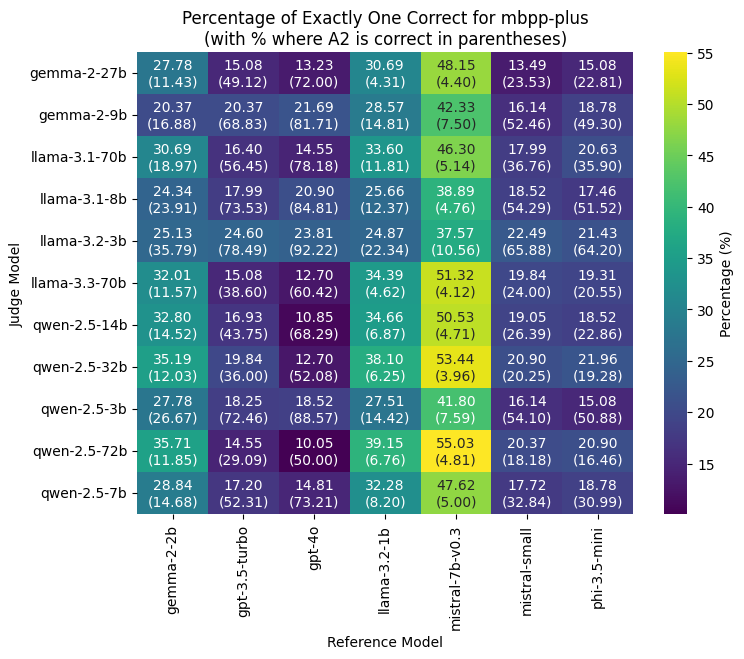

In [107]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Create a table of results for all dataset, judge, ref pairs
results = []
for dataset in base:
    for judge in base[dataset]:
        for ref in base[dataset][judge]:
            count, pct, a2_pct = get_exactly_one_correct(base, dataset, judge, ref)
            results.append({
                'Dataset': dataset,
                'Judge': judge,
                'Ref': ref,
                'Count': count,
                'Percentage': pct,
                'A2_Correct_Pct': a2_pct
            })

df = pd.DataFrame(results)

# For each dataset, create a heatmap: rows = Judge, columns = Ref, values = Percentage, annot with A2_Correct_Pct
for dataset in df['Dataset'].unique():
    dataset_df = df[df['Dataset'] == dataset]
    pct_pivot = dataset_df.pivot(index='Judge', columns='Ref', values='Percentage')
    a2_pivot = dataset_df.pivot(index='Judge', columns='Ref', values='A2_Correct_Pct')
    # Create annotation matrix
    annot_matrix = pct_pivot.applymap(lambda x: f"{x:.2f}") + "\n(" + a2_pivot.applymap(lambda x: f"{x:.2f}") + ")"
    plt.figure(figsize=(8, 6))
    sns.heatmap(pct_pivot, annot=annot_matrix, fmt="", cmap="viridis", cbar_kws={'label': 'Percentage (%)'})
    plt.title(f'Percentage of Exactly One Correct for {dataset}\n(with % where A2 is correct in parentheses)')
    plt.xlabel('Reference Model')
    plt.ylabel('Judge Model')
    plt.show()

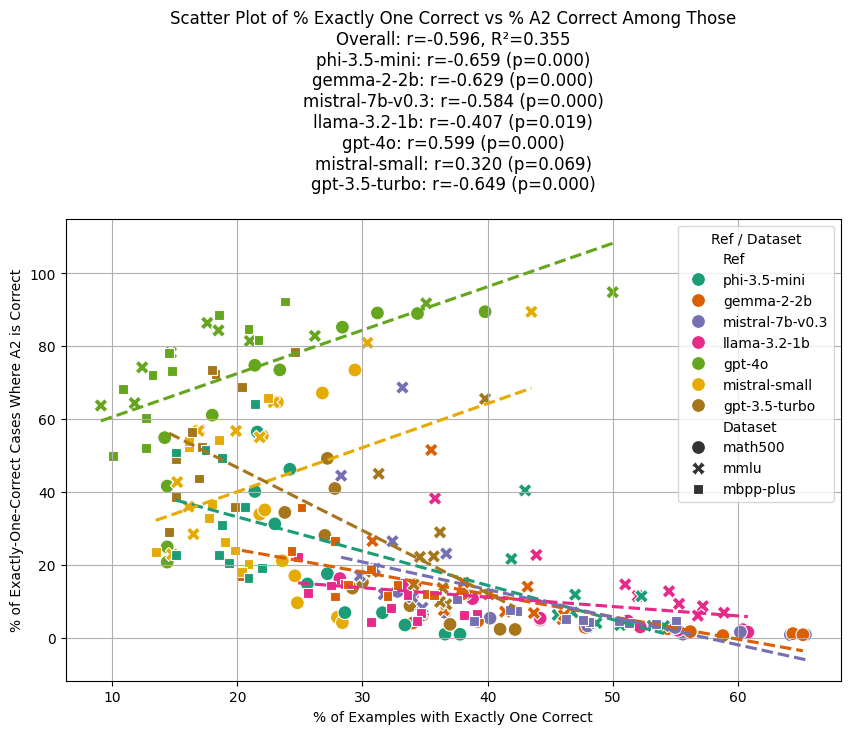

In [108]:
import scipy.stats as stats

# Scatter plot: x = Percentage of exactly one correct, y = % of A2 correct among those
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df, x='Percentage', y='A2_Correct_Pct', hue='Ref', style='Dataset', palette='Dark2', s=100)

# Get colors for refs
ref_colors = {}
palette = sns.color_palette('Dark2', len(df['Ref'].unique()))
for i, ref in enumerate(df['Ref'].unique()):
    ref_colors[ref] = palette[i]

# Individual regression lines for each ref
for ref in df['Ref'].unique():
    subset = df[df['Ref'] == ref]
    if len(subset) > 1:
        sns.regplot(data=subset, x='Percentage', y='A2_Correct_Pct', line_kws={'linestyle': '--'}, scatter=False, color=ref_colors[ref], ci = False)

# Calculate overall correlation and R²
slope, intercept, r_value, p_value, std_err = stats.linregress(df['Percentage'], df['A2_Correct_Pct'])
r_squared = r_value**2

# Calculate correlations for each ref
correlations = {}
for ref in df['Ref'].unique():
    subset = df[df['Ref'] == ref]
    if len(subset) > 1:
        r_val, p_val = stats.pearsonr(subset['Percentage'], subset['A2_Correct_Pct'])
        correlations[ref] = (r_val, p_val)

corr_text = "Overall: r={:.3f}, R²={:.3f}\n".format(r_value, r_squared)
for ref, (r, p) in correlations.items():
    corr_text += f"{ref}: r={r:.3f} (p={p:.3f})\n"

plt.title(f'Scatter Plot of % Exactly One Correct vs % A2 Correct Among Those\n{corr_text}')
plt.xlabel('% of Examples with Exactly One Correct')
plt.ylabel('% of Exactly-One-Correct Cases Where A2 is Correct')
plt.legend(title='Ref / Dataset')
plt.grid(True)
plt.show()

/var/folders/th/r_z7m5js0_z5lgk1tlr478p40000gn/T/ipykernel_63151/4111349348.py:47: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  annot_matrix = same_pivot.applymap(lambda x: f"{x:.2f}") + "\n(" + wrong_pivot.applymap(lambda x: f"{x:.2f}") + ")"


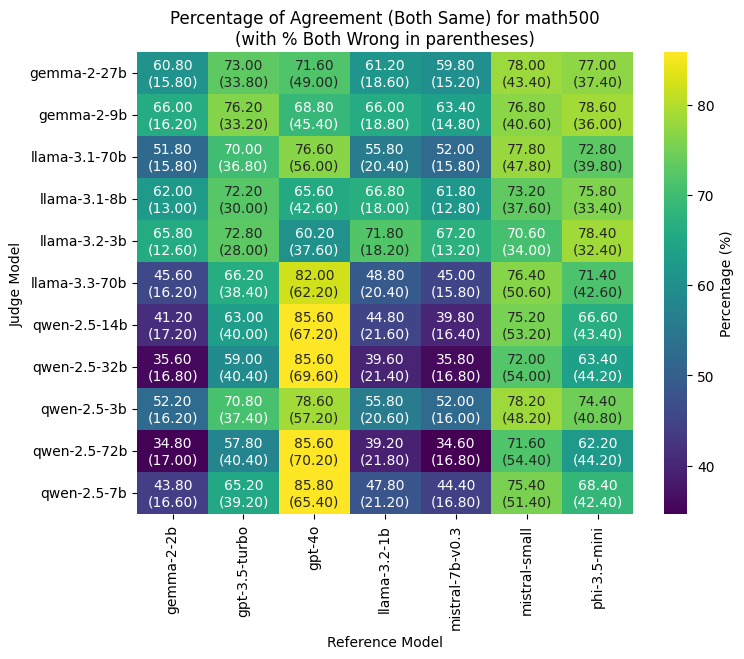

/var/folders/th/r_z7m5js0_z5lgk1tlr478p40000gn/T/ipykernel_63151/4111349348.py:47: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  annot_matrix = same_pivot.applymap(lambda x: f"{x:.2f}") + "\n(" + wrong_pivot.applymap(lambda x: f"{x:.2f}") + ")"


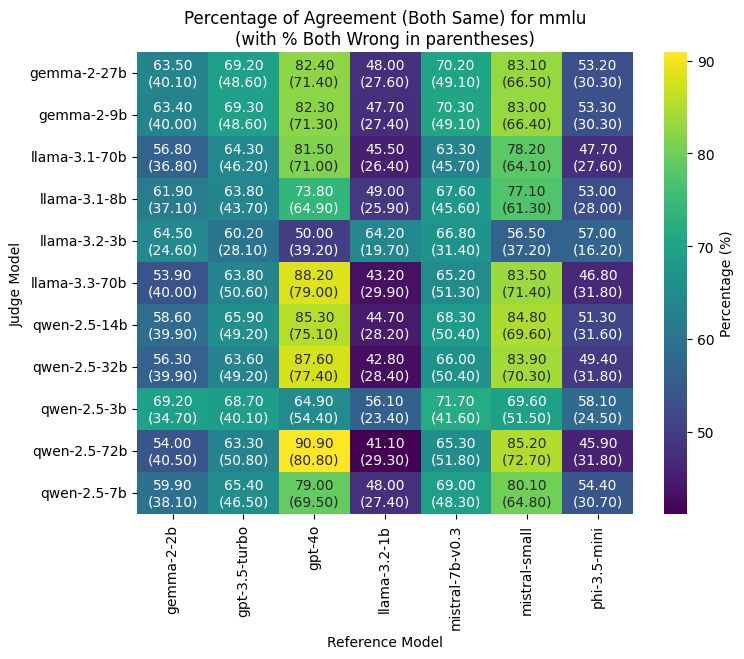

/var/folders/th/r_z7m5js0_z5lgk1tlr478p40000gn/T/ipykernel_63151/4111349348.py:47: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  annot_matrix = same_pivot.applymap(lambda x: f"{x:.2f}") + "\n(" + wrong_pivot.applymap(lambda x: f"{x:.2f}") + ")"


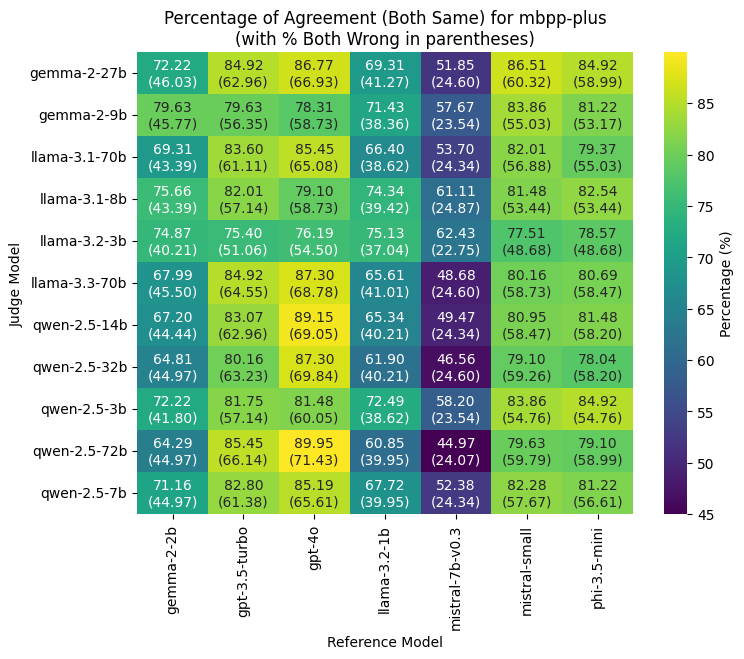

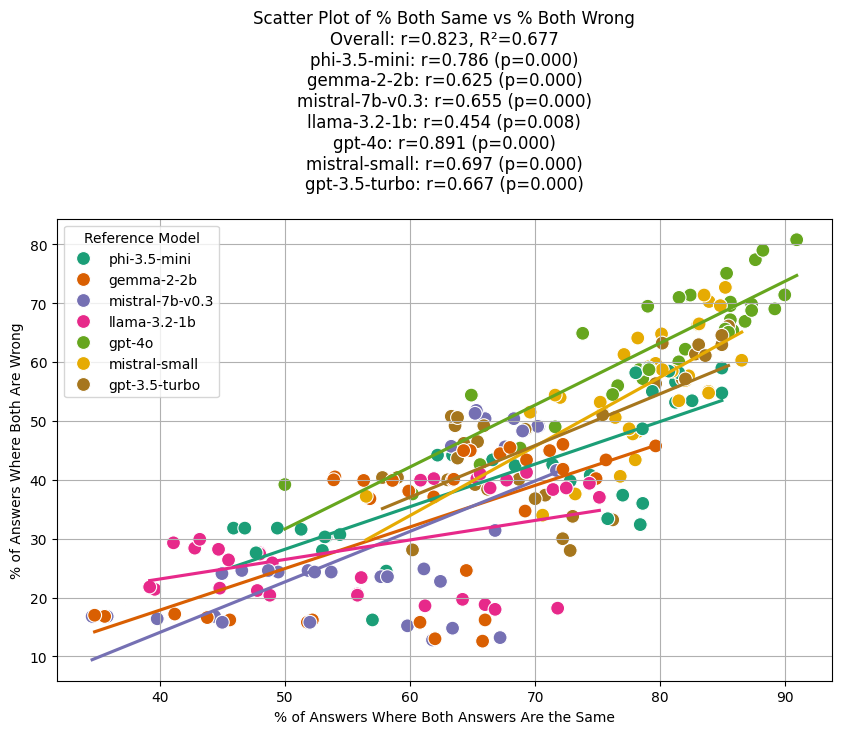

In [117]:
def get_agreement_metrics(base, dataset, judge, ref):
    """
    Takes base data, dataset, judge, ref.
    Returns the percentage of answers where both answers are the same,
    and the percentage of answers where both are wrong.
    """
    data = base[dataset][judge][ref]
    total = len(data)
    both_same = 0
    both_wrong = 0
    both_right = 0
    for datapoint in data:
        a1_correct = datapoint['assistent_1_is_correct']
        a2_correct = datapoint['assistent_2_is_correct']
        if a1_correct == a2_correct:
            both_same += 1
            if not a1_correct:
                both_wrong += 1
            else:
                both_right += 1
    both_same_pct = (both_same / total) * 100 if total > 0 else 0
    both_wrong_pct = (both_right / total) * 100 if both_same > 0 else 0
    return both_same_pct, both_wrong_pct

# Create a table of results for all dataset, judge, ref pairs
results_agreement = []
for dataset in base:
    for judge in base[dataset]:
        for ref in base[dataset][judge]:
            both_same_pct, both_wrong_pct = get_agreement_metrics(base, dataset, judge, ref)
            results_agreement.append({
                'Dataset': dataset,
                'Judge': judge,
                'Ref': ref,
                'Both_Same_Pct': both_same_pct,
                'Both_Wrong_Pct': both_wrong_pct
            })

df_agreement = pd.DataFrame(results_agreement)

# For each dataset, create a heatmap: rows = Judge, columns = Ref, values = Both_Same_Pct, annot with Both_Wrong_Pct
for dataset in df_agreement['Dataset'].unique():
    dataset_df = df_agreement[df_agreement['Dataset'] == dataset]
    same_pivot = dataset_df.pivot(index='Judge', columns='Ref', values='Both_Same_Pct')
    wrong_pivot = dataset_df.pivot(index='Judge', columns='Ref', values='Both_Wrong_Pct')
    # Create annotation matrix
    annot_matrix = same_pivot.applymap(lambda x: f"{x:.2f}") + "\n(" + wrong_pivot.applymap(lambda x: f"{x:.2f}") + ")"
    plt.figure(figsize=(8, 6))
    sns.heatmap(same_pivot, annot=annot_matrix, fmt="", cmap="viridis", cbar_kws={'label': 'Percentage (%)'})
    plt.title(f'Percentage of Agreement (Both Same) for {dataset}\n(with % Both Wrong in parentheses)')
    plt.xlabel('Reference Model')
    plt.ylabel('Judge Model')
    plt.show()

# Scatter plot: x = % Both Same, y = % Both Wrong
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df_agreement, x='Both_Same_Pct', y='Both_Wrong_Pct', hue='Ref', palette='Dark2', s=100)

# Get colors for refs
ref_colors_agreement = {}
palette_agreement = sns.color_palette('Dark2', len(df_agreement['Ref'].unique()))
for i, ref in enumerate(df_agreement['Ref'].unique()):
    ref_colors_agreement[ref] = palette_agreement[i]

# Individual regression lines for each ref
for ref in df_agreement['Ref'].unique():
    subset = df_agreement[df_agreement['Ref'] == ref]
    if len(subset) > 1:
        sns.regplot(data=subset, x='Both_Same_Pct', y='Both_Wrong_Pct', scatter=False, color=ref_colors_agreement[ref], ci=None)

# Calculate overall correlation and R²
slope, intercept, r_value, p_value, std_err = stats.linregress(df_agreement['Both_Same_Pct'], df_agreement['Both_Wrong_Pct'])
r_squared = r_value**2

# Calculate correlations for each ref
correlations_agreement = {}
for ref in df_agreement['Ref'].unique():
    subset = df_agreement[df_agreement['Ref'] == ref]
    if len(subset) > 1:
        r_val, p_val = stats.pearsonr(subset['Both_Same_Pct'], subset['Both_Wrong_Pct'])
        correlations_agreement[ref] = (r_val, p_val)

corr_text_agreement = "Overall: r={:.3f}, R²={:.3f}\n".format(r_value, r_squared)
for ref, (r, p) in correlations_agreement.items():
    corr_text_agreement += f"{ref}: r={r:.3f} (p={p:.3f})\n"

plt.title(f'Scatter Plot of % Both Same vs % Both Wrong\n{corr_text_agreement}')
plt.xlabel('% of Answers Where Both Answers Are the Same')
plt.ylabel('% of Answers Where Both Are Wrong')
plt.legend(title='Reference Model')
plt.grid(True)
plt.show()

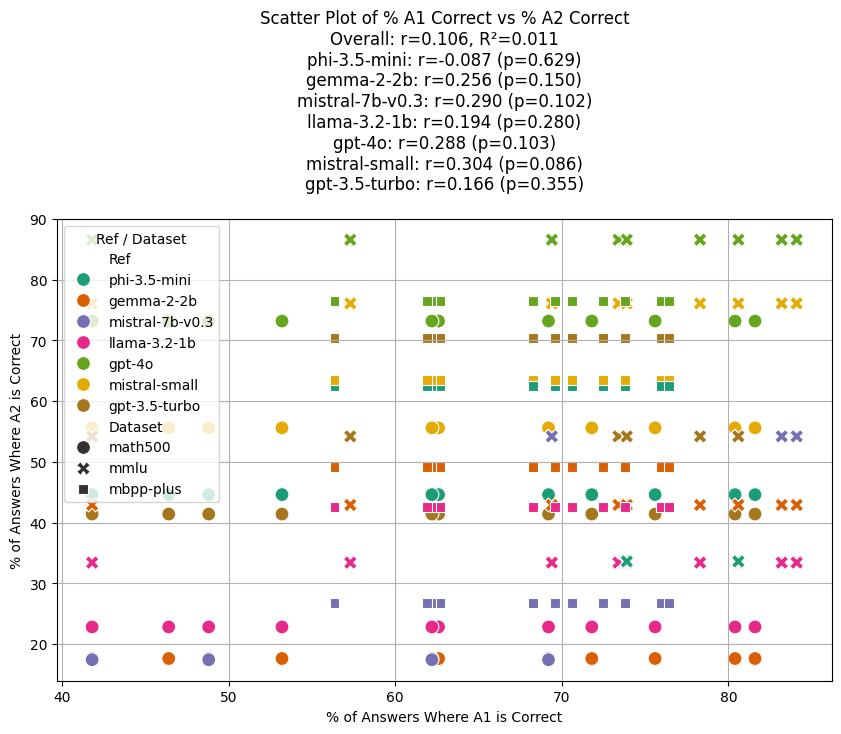

In [119]:
# New scatter plot: x = % A1 Correct, y = % A2 Correct
# Compute % A1 correct and % A2 correct for each dataset, judge, ref
results_correctness = []
for dataset in base:
    for judge in base[dataset]:
        for ref in base[dataset][judge]:
            data = base[dataset][judge][ref]
            total = len(data)
            a1_correct_count = sum(1 for d in data if d['assistent_1_is_correct'])
            a2_correct_count = sum(1 for d in data if d['assistent_2_is_correct'])
            a1_correct_pct = (a1_correct_count / total) * 100 if total > 0 else 0
            a2_correct_pct = (a2_correct_count / total) * 100 if total > 0 else 0
            results_correctness.append({
                'Dataset': dataset,
                'Judge': judge,
                'Ref': ref,
                'A1_Correct_Pct': a1_correct_pct,
                'A2_Correct_Pct': a2_correct_pct
            })

df_correctness = pd.DataFrame(results_correctness)

# Scatter plot
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df_correctness, x='A1_Correct_Pct', y='A2_Correct_Pct', hue='Ref', style='Dataset', palette='Dark2', s=100)


plt.title(f'Scatter Plot of % A1 Correct vs % A2 Correct\n{corr_text_correctness}')
plt.xlabel('% of Answers Where A1 is Correct')
plt.ylabel('% of Answers Where A2 is Correct')
plt.legend(title='Ref / Dataset')
plt.grid(True)
plt.show()

### Header 2: % of A2 Correct v. HSPP

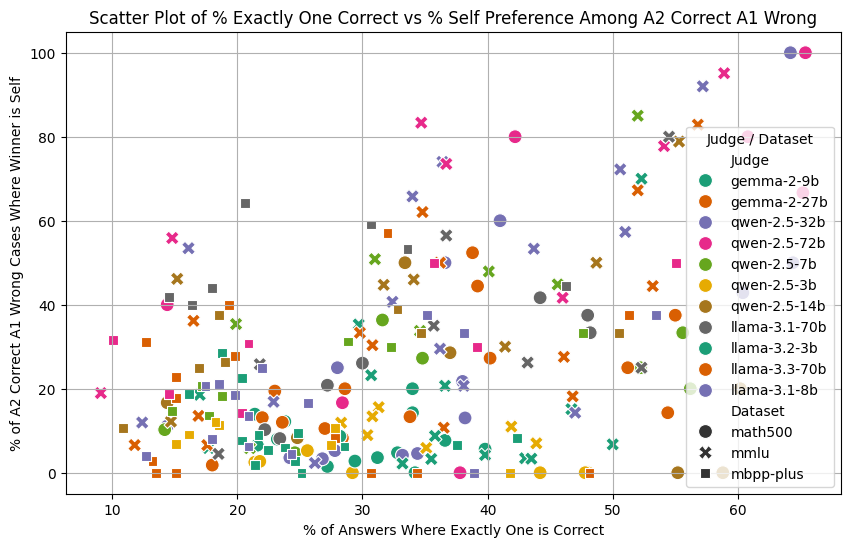

In [125]:
# Scatter plot: x = % A2 Correct and A1 Wrong, y = % of those where winner is 'self'
results_self_pref = []
for dataset in base:
    for judge in base[dataset]:
        for ref in base[dataset][judge]:
            data = base[dataset][judge][ref]
            total = len(data)
            total_a2_correct_a1_wrong = sum(1 for d in data if d['assistent_2_is_correct'] and not d['assistent_1_is_correct'])
            count_self = 0
            for i, d in enumerate(data):
                if d['assistent_2_is_correct'] and not d['assistent_1_is_correct']:
                    winner, p_self = get_winner(base, dataset, judge, ref, i)
                    if winner == 'self':
                        count_self += 1
            x_pct = (total_a2_correct_a1_wrong / total) * 100 if total > 0 else 0
            y_pct = (count_self / total_a2_correct_a1_wrong) * 100 if total_a2_correct_a1_wrong > 0 else 0
            pct_exactly_one = get_exactly_one_correct(base, dataset, judge, ref)[1]
            results_self_pref.append({
                'Dataset': dataset,
                'Judge': judge,
                'Ref': ref,
                'A2_Correct_A1_Wrong_Pct': x_pct,
                'Self_Pref_Among_Those_Pct': y_pct,
                'Pct_Exactly_One': pct_exactly_one
            })

df_self_pref = pd.DataFrame(results_self_pref)

# Scatter plot
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df_self_pref, x='Pct_Exactly_One', y='Self_Pref_Among_Those_Pct', hue='Judge', style='Dataset', palette='Dark2', s=100)

plt.title('Scatter Plot of % Exactly One Correct vs % Self Preference Among A2 Correct A1 Wrong')
plt.xlabel('% of Answers Where Exactly One is Correct')
plt.ylabel('% of A2 Correct A1 Wrong Cases Where Winner is Self')
plt.legend(title='Judge / Dataset')
plt.grid(True)
plt.show()

[0.0009108977392315865, 0.9989206790924072, 0.00016849914391059428]
[0.00033530627842992544, 0.9995334148406982, 0.00013130776642356068]
---
[0.0953470841050148, 2.4910243155318312e-05, 0.9046279788017273]
[0.00033535013790242374, 3.783505853677006e-44, 0.9996646642684937]
---
[0.022941499948501587, 0.001561188604682684, 0.9754973649978638]
[0.6181846261024475, 0.0068674106150865555, 0.3749479353427887]
---
[0.22270014882087708, 3.6433760072445244e-44, 0.7772998809814453]
[0.005220039281994104, 1.6614239939372055e-05, 0.9947633743286133]
---
[0.9890130758285522, 3.783505853677006e-44, 0.010986942797899246]
[0.00359353912062943, 1.7714664863888174e-05, 0.9963887929916382]
---
[0.008575120940804482, 0.00027564680203795433, 0.9911491870880127]
[0.37525075674057007, 0.006065363064408302, 0.6186838746070862]
---
[0.025956057012081146, 5.0106980779673904e-05, 0.9739938974380493]
[0.9706172347068787, 7.265247404575348e-05, 0.02931010164320469]
---
[0.0007551187882199883, 0.9988651275634766, 0

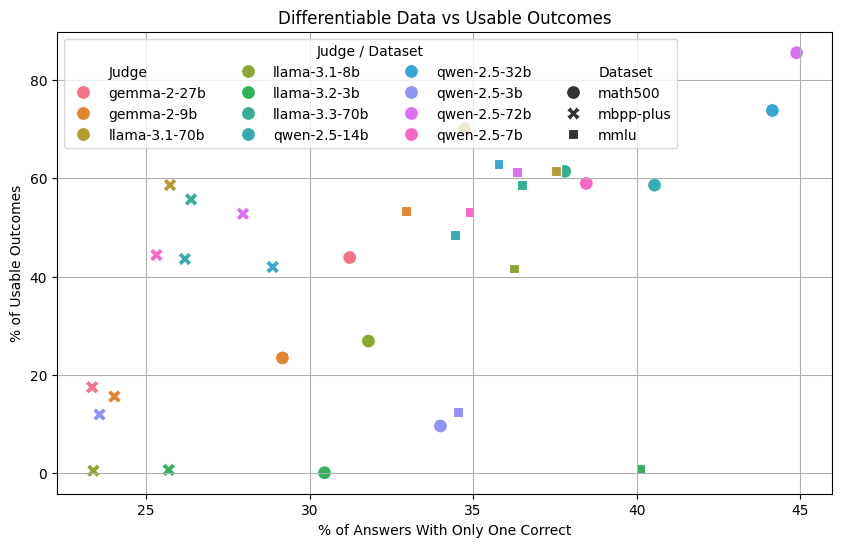

In [143]:
# First plot: x = % A2 correct A1 wrong, y = % of those with winner = type, color by type
results_first = []
for dataset in base:
    for judge in base[dataset]:
        for ref in base[dataset][judge]:
            data = base[dataset][judge][ref]
            total = len(data)
            total_a2_correct_a1_wrong = sum(1 for d in data if d['assistent_2_is_correct'] != d['assistent_1_is_correct'])
            pct_x = (total_a2_correct_a1_wrong / total) * 100 if total > 0 else 0
            count_self = 0
            count_other = 0
            count_tie = 0
            count_conflict = 0
            for i, d in enumerate(data):
                if d['assistent_2_is_correct'] != d['assistent_1_is_correct']:
                    winner, _ = get_winner(base, dataset, judge, ref, i, conflict =True)
                    if winner == 'self':
                        count_self += 1
                    elif winner == 'other':
                        count_self += 1
                    # elif winner == 'tie':
                    #     count_tie += 1
                    # elif winner == 'conflict':
                    #     count_conflict += 1
            for type_name, count in [('useable', count_self)]: #, ('other', count_other), ('tie', count_tie), ('conflict', count_conflict)]:
                y = (count / total_a2_correct_a1_wrong) * 100 if total_a2_correct_a1_wrong > 0 else 0
                results_first.append({
                    'Dataset': dataset,
                    'Judge': judge,
                    'Ref': ref,
                    'Pct_A2_Correct_A1_Wrong': pct_x,
                    #'Type': type_name,
                    'Pct_Type': y
                })

df_first = pd.DataFrame(results_first)
good_mask = [dff in ['gpt-3.5-turbo', 'gpt-4o', 'mistral-small', 'phi-3.5-mini'] for dff in df_first['Ref']]
#df_first = df_first[good_mask]
#aggregate by ref, keep judge, dataset, and outcomes
df_first_agg = df_first.groupby(['Dataset', 'Judge']).agg({
    'Pct_A2_Correct_A1_Wrong': 'mean',
    'Pct_Type': 'mean'
}).reset_index()

plt.figure(figsize=(10, 6))
sns.scatterplot(data=df_first_agg, x='Pct_A2_Correct_A1_Wrong', y='Pct_Type', hue='Judge', style='Dataset',  s=100)
plt.title('Differentiable Data vs Usable Outcomes')
plt.xlabel('% of Answers With Only One Correct')
plt.ylabel('% of Usable Outcomes')
plt.legend(title='Judge / Dataset', ncol=4, loc='upper left')
plt.grid(True)

plt.show()


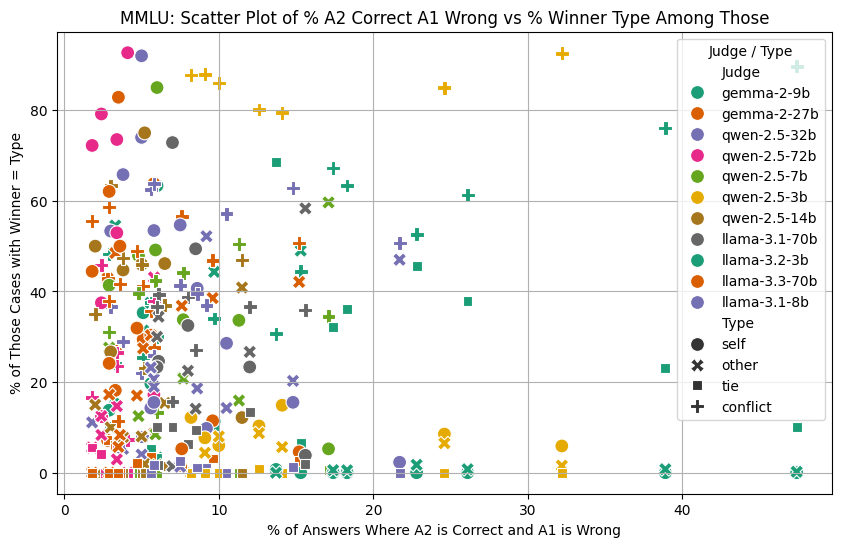

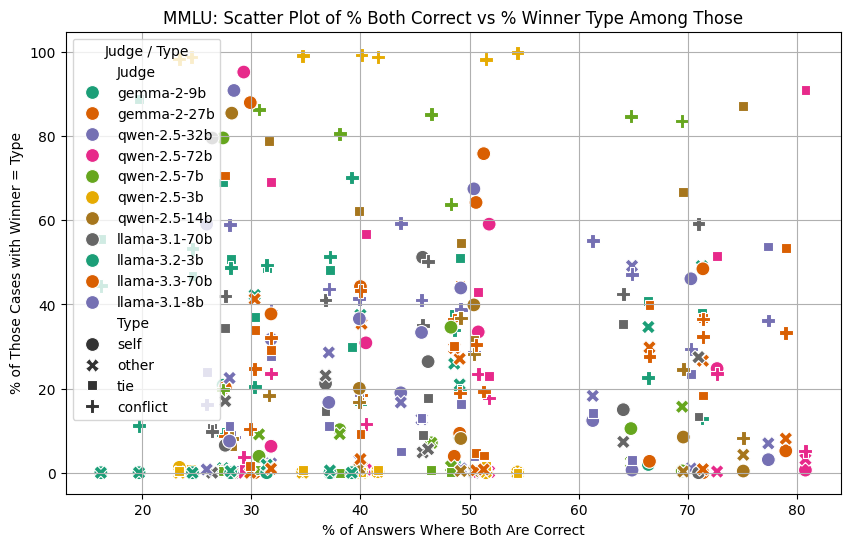

In [141]:
# MMLU only: First plot
df_first_mmlu = df_first[df_first['Dataset'] == 'mmlu']

plt.figure(figsize=(10, 6))
sns.scatterplot(data=df_first_mmlu, x='Pct_A2_Correct_A1_Wrong', y='Pct_Type', hue='Judge', style='Type', palette='Dark2', s=100)
plt.title('MMLU: Scatter Plot of % A2 Correct A1 Wrong vs % Winner Type Among Those')
plt.xlabel('% of Answers Where A2 is Correct and A1 is Wrong')
plt.ylabel('% of Those Cases with Winner = Type')
plt.legend(title='Judge / Type')
plt.grid(True)
plt.show()

# MMLU only: Second plot
df_second_mmlu = df_second[df_second['Dataset'] == 'mmlu']

plt.figure(figsize=(10, 6))
sns.scatterplot(data=df_second_mmlu, x='Pct_Both_Correct', y='Pct_Type', hue='Judge', style='Type', palette='Dark2', s=100)
plt.title('MMLU: Scatter Plot of % Both Correct vs % Winner Type Among Those')
plt.xlabel('% of Answers Where Both Are Correct')
plt.ylabel('% of Those Cases with Winner = Type')
plt.legend(title='Judge / Type')
plt.grid(True)
plt.show()